Test thermal problems using MFEANet

* Two-phase material systems, test the interface property

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import DataLoader
from torch.nn.modules.utils import _pair
import os
import numpy as np
import matplotlib.pyplot as plt
import math
import random
import time

from utils import plot
from feanet.singlegrid import SingleGrid
from feanet.multigrid import MultiGrid
from feanet.iterator import PsiNet
from feanet.iterator import PsiIterator
from data.dataset import MechanicalDataSet

In [2]:
device_predict = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') #torch.device('cpu') #
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

In [3]:
n_elem = 2**6 # element size on the edge
nb_layers = 3
bs = 1
hsize = 2e-4 # m
ku, kf = 1, 1

no_neumann_test = False # considering Neumann bc for testing
train = False # True or False
model_name = 'dirich_33x33_smoother'
model_dir = 'model/learn_iterator/thermal'
if not os.path.exists(model_dir):
    os.makedirs(model_dir)


In [4]:
test_set = MechanicalDataSet('data/data_thermal/plate_2phase.h5', device)
test_dataloader = DataLoader(test_set, batch_size=bs, shuffle=True)
elem_mask_test, node_mask_test, dirich_idx_test, dirich_value_test, neumann_idx_test, neumann_value_test, neumann_conn_test, material_test, f_test, u_test = next(iter(test_dataloader))

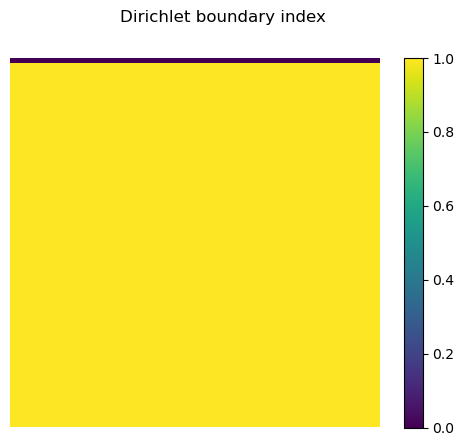

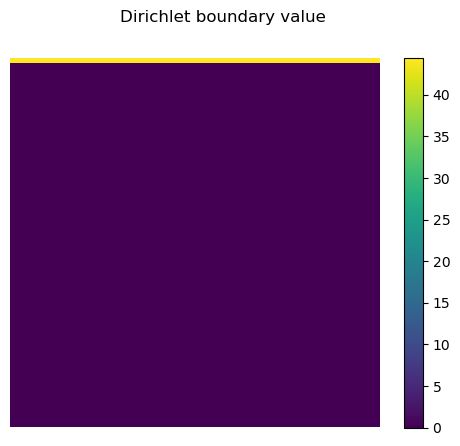

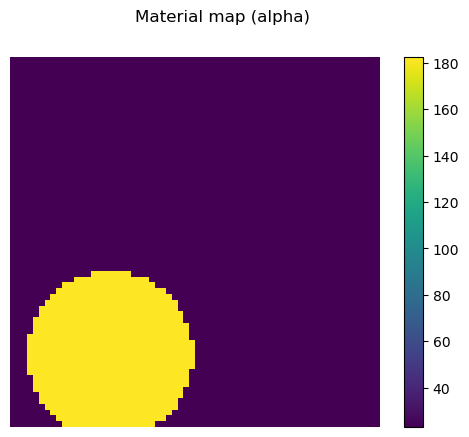

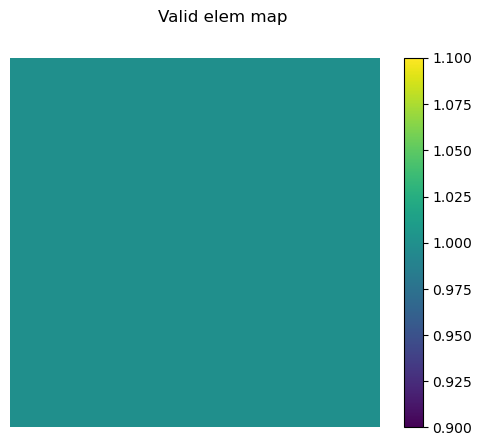

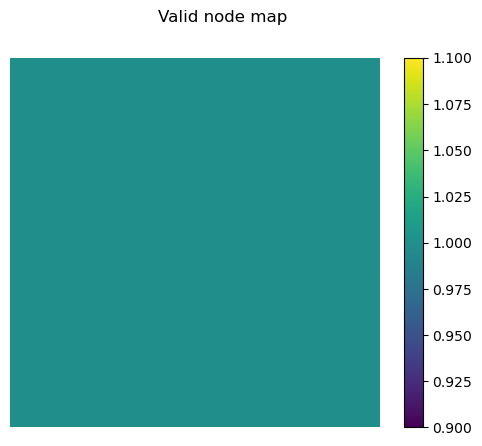

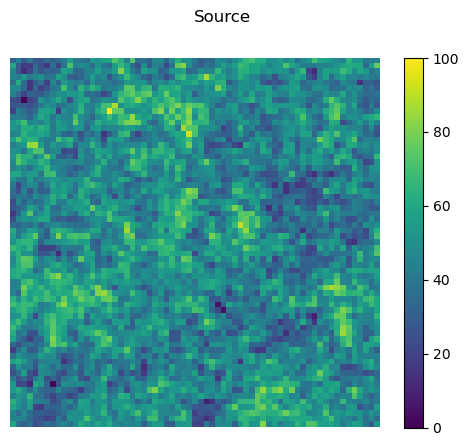

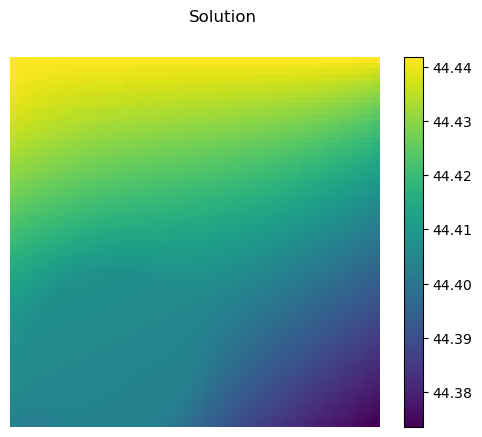

In [5]:
k = 0 # the index of test data to be shown
plot.plot_thermalfield(dirich_idx_test[k], ftitle='Dirichlet boundary index')
plot.plot_thermalfield(dirich_value_test[k], ftitle='Dirichlet boundary value')
#plot.plot_thermalfield(neumann_idx_test[k], ftitle='Flux boundary idx')
#plot.plot_thermalfield(neumann_value_test[k], ftitle='Flux boundary value')
plot.plot_thermalfield(material_test[k], ftitle='Material map (alpha)')
plot.plot_thermalfield(elem_mask_test[k], ftitle='Valid elem map')
plot.plot_thermalfield(node_mask_test[k], ftitle='Valid node map')
plot.plot_thermalfield(f_test[k], ftitle='Source')
plot.plot_thermalfield(u_test[k], ftitle='Solution')

Create a set of solution data for testing purpose

In [6]:
solution_test, rhs_test, d_test, d_idx_test, t_idx_test, t_test, t_conn_test, m_test, emsk_test, nmsk_test = (torch.unsqueeze(u_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(f_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(dirich_value_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(dirich_idx_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_idx_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_value_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(neumann_conn_test[k], 0).to(device_predict), 
                                                                         torch.unsqueeze(material_test[k], 0).to(device_predict),
                                                                         torch.unsqueeze(elem_mask_test[k], 0).to(device_predict),
                                                                         torch.unsqueeze(node_mask_test[k], 0).to(device_predict))

In [7]:
d_test

tensor([[[[44.4415, 44.4415, 44.4415,  ..., 44.4415, 44.4415, 44.4415],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          ...,
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
          [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]]]],
       dtype=torch.float64)

In [8]:
t_test

tensor([[[[  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          ...,
          [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [  0.0000,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [-95.2373, -95.2373, -95.2373,  ..., -95.2373, -95.2373, -95.2373]],

         [[ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          ...,
          [ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000],
          [ 47.4258,   0.0000,   0.0000,  ...,   0.0000,   0.0000,   0.0000]],

         [[  0.0000,   0.0000,

Test using single grid FEA-Net

In [9]:
grid = SingleGrid(hsize, n_elem=n_elem, mode='thermal', dev=device_predict, no_neumann=no_neumann_test)

0 815.9482081328728
1 456.12865300627027
2 330.49642331899963
3 264.0648126670057
4 222.243534256162
5 193.19611180418465
6 171.69844975691882
7 155.06414807521247
8 141.76148823437967
9 130.84921214710744
10 121.71500410253599
11 113.94225899036182
12 107.23705466849482
13 101.38571385239503
14 96.22893300553937
15 91.64536770056985
16 87.54085880573854
17 83.84115201579836
18 80.48685189273945
19 77.42984605853067
20 74.63072092502553
21 72.05686102666631
22 69.68102899990913
23 67.48028952554117
24 65.43518337627086
25 63.52908597624678
26 61.747703892644516
27 60.07867569444725
28 58.51125266546044
29 57.03604124694315
30 55.6447936549684
31 54.33023642748257
32 53.085929081228755
33 51.90614685492995
34 50.78578285891373
35 49.72026596614187
36 48.70549155272007
37 47.7377627897941
38 46.81374064849307
39 45.93040113804443
40 45.084998578724566
41 44.275033933773685
42 43.498227401367174
43 42.75249460926627
44 42.03592586865431
45 41.34676803573312
46 40.68340860450815
47 40.0443

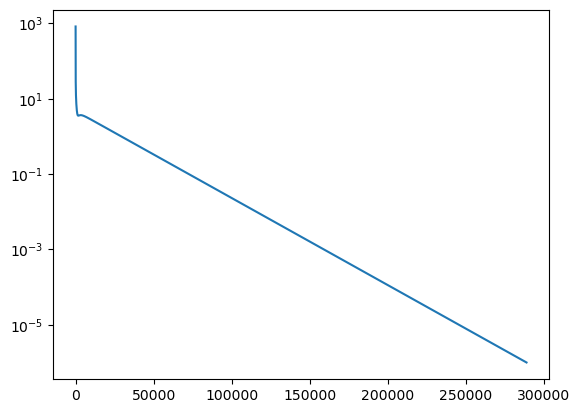

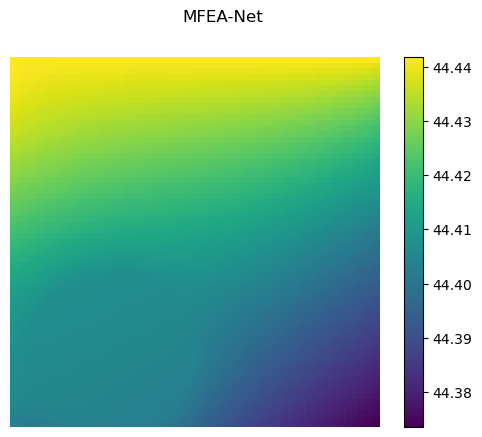

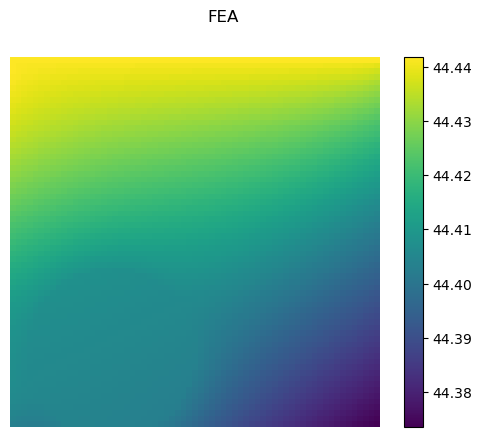

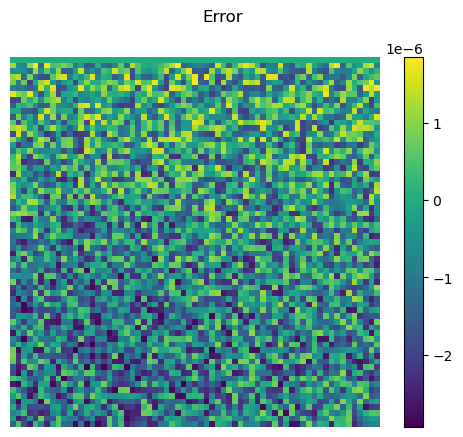

In [10]:
EPS = 1e-6
n_jac = 0
jacu_test = 40*torch.ones(size=(1, ku, n_elem+1, n_elem+1), requires_grad=False, dtype=torch.double).to(device_predict)
jacu_test = grid.jac.reset_boundary(jacu_test, d_test, d_idx_test)
residual_jac = grid.net(None, None, hsize, jacu_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
res = torch.norm(residual_jac).item() 
res_arr = [res]

if(True):
    print(n_jac, res)
    while (abs(res) > EPS):
        jacu_test = grid.jac.jacobi_convolution(jacu_test, m_test, nmsk_test, d_test, d_idx_test, None, None, hsize, rhs_test, t_test, t_conn_test)
        residual_jac = grid.net(None, None, hsize, jacu_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual_jac).item() 
        res_arr.append(res)
        n_jac += 1
        print(n_jac, res)

    print("Solution converges after", n_jac, "Jacobi iterations ")
    plt.plot(res_arr)
    plt.yscale('log')
    plt.show()

    plot.plot_thermalfield(jacu_test[0], "MFEA-Net")
    plot.plot_thermalfield(solution_test[0], "FEA")
    plot.plot_thermalfield(jacu_test[0]-solution_test[0], 'Error')

Test the learned smoother

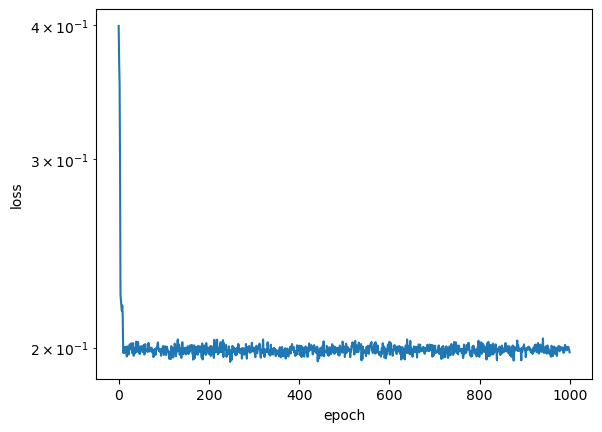

In [11]:
# import the learned model and loss train
my_net = PsiNet(nb_layers=nb_layers, mode='thermal').to(device_predict)
my_net.load_state_dict(torch.load(os.path.join(model_dir,model_name+'.pth')))
new_iterator = PsiIterator(device_predict, hsize, n_elem, no_neumann_test, psi_net=my_net, grid=grid, nb_layers=nb_layers, batch_size=1, iterator='psi')
my_loss = torch.load(os.path.join(model_dir,model_name+'.pt'))
plt.plot(my_loss)
plt.ylabel('loss')
plt.yscale('log')
plt.xlabel('epoch')
plt.savefig('results/smoother_loss.jpg', dpi=500, bbox_inches='tight')

0 815.9482081328728
1 159.15374784712054
2 77.33685504475608
3 56.14967376787597
4 45.42529895880768
5 38.59355818982973
6 33.783535495659585
7 30.183626945819814
8 27.372133847237215
9 25.106381289620426
10 23.235818138975837
11 21.661615938215295
12 20.31595322162831
13 19.150600486771413
14 18.130243943691585
15 17.228387233218648
16 16.424732493083606
17 15.70344933599273
18 15.051997246175898
19 14.460304217319239
20 13.920181219994427
21 13.424896688164447
22 12.968861995169192
23 12.547395436702516
24 12.156542725723785
25 11.792938806711929
26 11.453700304267862
27 11.136340967963575
28 10.838704573107313
29 10.558911206071878
30 10.295313907449147
31 10.046463399494707
32 9.811079174152148
33 9.588025623782116
34 9.376292199136998
35 9.174976806544581
36 8.983271828491233
37 8.80045228329525
38 8.625865740489338
39 8.458923686555819
40 8.299094096293658
41 8.145895012443821
42 7.998888973473436
43 7.857678158778888
44 7.721900143958924
45 7.591224177447591
46 7.465347904759477

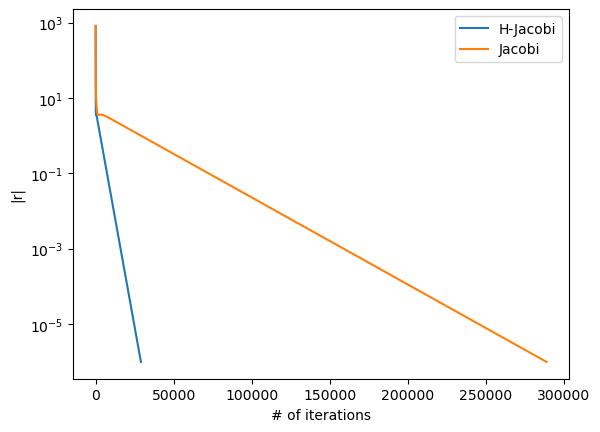

In [12]:
EPS = 1e-6
with torch.no_grad():
    n_new = 0
    u_test = 40*torch.ones(size=(1, ku, n_elem+1, n_elem+1), requires_grad=False, dtype=torch.double).to(device_predict)
    u_test = new_iterator.grid.jac.reset_boundary(u_test, d_test, d_idx_test)
    residual_H = new_iterator.grid.net(None, None, hsize, u_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
    res = torch.norm(residual_H).item() # fix top, apply traction force at bottom boundary
    res_arr_new = [res]
    print(n_new, res)
    while (abs(res) > EPS):
        u_test = new_iterator.PsiRelax(u_test, m_test, nmsk_test, d_test, d_idx_test, None, None, hsize, rhs_test, t_test, t_conn_test, 1)
        residual_H = new_iterator.grid.net(None, None, hsize, u_test, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual_H).item()
        res_arr_new.append(res)
        n_new += 1
        print(n_new, res)

print("Solution converges after", n_new, "iterations ")
plt.plot(res_arr_new, label='H-Jacobi')
plt.plot(res_arr, label='Jacobi')
plt.ylabel('|r|')
plt.xlabel('# of iterations')
plt.yscale('log')
plt.legend()
plt.savefig('results/jac_res.jpg', dpi=500, bbox_inches='tight')
plt.show()

In [13]:
with torch.no_grad():
    n = n_elem
    n_mg_jac = 0
    mg_jac = MultiGrid(hsize, n, no_neumann_test, pacnet=my_net, device=device, nb_layers=nb_layers, iterator='jac') # create a multigrid model
    mg_jac.ProblemDictArray(rhs_test,t_test,t_conn_test,d_test,d_idx_test,m_test,nmsk_test)
    u_mg_jac = 40*torch.ones((1, 1, n+1, n+1), requires_grad=False, dtype=torch.double).to(device)
    u_mg_jac = mg_jac.iterators[0].grid.jac.reset_boundary(u_mg_jac, d_test, d_idx_test)
    residual_mgjac = mg_jac.iterators[0].grid.net(None, None, hsize, u_mg_jac, d_idx_test, rhs_test, t_test, t_conn_test, m_test,nmsk_test)
    res = torch.norm(residual_mgjac).item()
    err_occured = False
    res_arr_mgjac = [res]
    print(n_mg_jac, res)

    start = time.time()
    while (abs(res) > EPS):
        u_mg_jac = mg_jac.Step(u_mg_jac)
        residual_mgjac = mg_jac.iterators[0].grid.net(None, None, hsize, u_mg_jac, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual_mgjac).item()
        res_arr_mgjac.append(res)
        n_mg_jac += 1
        print(n_mg_jac, res)

        if(res == torch.inf or math.isnan(res)):
            err_occured = True
            break

    end = time.time()

if(err_occured):
    print("The iteration doesn't converge!")
else:
    print("Solution converges after", n_mg_jac, "Jacobi multigrid iterations in", end-start, 'seconds.')


0 815.9482081328728
1 182.35790708505712
2 44.91106147328987
3 11.46219338473764
4 3.611558008925677
5 2.281464889116008
6 2.1096800212849662
7 1.984475275018725
8 1.8197281843014064
9 1.6342840186328875
10 1.447367179991399
11 1.2703746239903921
12 1.1087232925439676
13 0.9642126987761224
14 0.8366845970152403
15 0.7250265453762235
16 0.6277347271057003
17 0.5432122017808615
18 0.4699172723375986
19 0.40643016630967627
20 0.35147670250934476
21 0.30393022455630075
22 0.2628032479292251
23 0.22723484118522586
24 0.19647681992395274
25 0.16988025971251533
26 0.14688300621972142
27 0.1269984338294336
28 0.10980548997856157
29 0.09493996144231606
30 0.08208685585541703
31 0.07097377885198733
32 0.061365188799444685
33 0.053057419131324335
34 0.045874369196892424
35 0.039663775591538525
36 0.03429398675658357
37 0.02965117342431134
38 0.02563691628448401
39 0.022166120007069964
40 0.01916520952709019
41 0.016570570512122792
42 0.01432720085275923
43 0.012387544760856245
44 0.01071048466140

In [14]:
with torch.no_grad():
    n = n_elem
    n_mg_psi = 0
    mg_psi = MultiGrid(hsize, n, no_neumann_test, pacnet=my_net, device=device, nb_layers=nb_layers, iterator='psi') # create a multigrid model
    mg_psi.ProblemDictArray(rhs_test,t_test,t_conn_test,d_test,d_idx_test,m_test,nmsk_test)
    u_mg_psi = 40*torch.ones((1, 1, n+1, n+1), requires_grad=False, dtype=torch.double).to(device)
    u_mg_psi = mg_psi.iterators[0].grid.jac.reset_boundary(u_mg_psi, d_test, d_idx_test)
    residual_mgpsi = mg_psi.iterators[0].grid.net(None, None, hsize, u_mg_psi, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
    res = torch.norm(residual_mgpsi).item()
    err_occured = False
    res_arr_mgpsi = [res]
    print(n_mg_psi, res)

    start = time.time()
    while (abs(res) > EPS):
        u_mg_psi = mg_psi.Step(u_mg_psi)
        residual_mgpsi = mg_psi.iterators[0].grid.net(None, None, hsize, u_mg_psi, d_idx_test, rhs_test, t_test, t_conn_test, m_test, nmsk_test)
        res = torch.norm(residual_mgpsi).item()
        res_arr_mgpsi.append(res)
        n_mg_psi += 1
        print(n_mg_psi, res)

        if(res == torch.inf or math.isnan(res)):
            err_occured = True
            break

    end = time.time()

if(err_occured):
    print("The iteration doesn't converge!")
else:
    print("Solution converges after", n_mg_psi, "Psi-Jacobi multigrid iterations in", end-start, 'seconds.')


0 815.9482081328728
1 14.717306259784765
2 2.51423560178845
3 2.1136464954088163
4 1.3639070795646562
5 0.7989639529005698
6 0.45536599922341053
7 0.25749358445120624
8 0.14527296133440082
9 0.08190661307549864
10 0.04617123016029389
11 0.02602558203612627
12 0.014669750054418895
13 0.008268810550589794
14 0.004660825173524034
15 0.00262713520802282
16 0.0014808190435230408
17 0.0008346829507929167
18 0.0004704799216252838
19 0.0002651921344621313
20 0.00014947900309914336
21 8.425578493451905e-05
22 4.749187183959706e-05
23 2.676940638225028e-05
24 1.5088928171629072e-05
25 8.505073526321352e-06
26 4.793991809187811e-06
27 2.702194648633529e-06
28 1.5231273443264219e-06
29 8.585316905620923e-07
Solution converges after 29 Psi-Jacobi multigrid iterations in 0.14847517013549805 seconds.


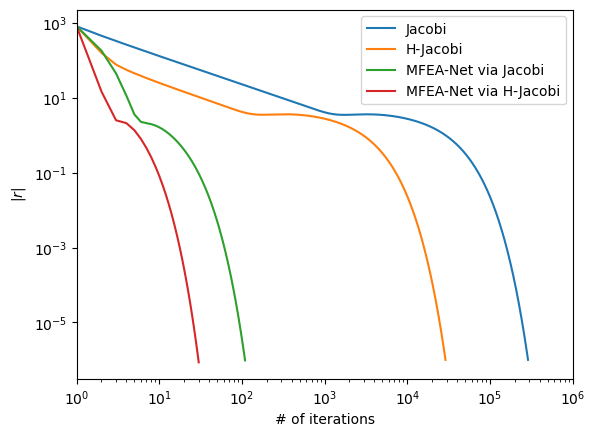

In [29]:
plt.plot(np.arange(1, len(res_arr)+1, dtype=np.int32), res_arr, label='Jacobi')
plt.plot(np.arange(1, len(res_arr_new)+1, dtype=np.int32), res_arr_new, label='H-Jacobi')
plt.plot(np.arange(1, len(res_arr_mgjac)+1, dtype=np.int32), res_arr_mgjac, label='MFEA-Net via Jacobi')
plt.plot(np.arange(1, len(res_arr_mgpsi)+1, dtype=np.int32), res_arr_mgpsi, label='MFEA-Net via H-Jacobi')
plt.xscale('log')
plt.yscale('log')
plt.xlim([1,1e6])
plt.legend()
plt.ylabel('|$r$|')
plt.xlabel('# of iterations')
plt.savefig('results/compare_res.jpg', dpi=500, bbox_inches='tight')
plt.show()

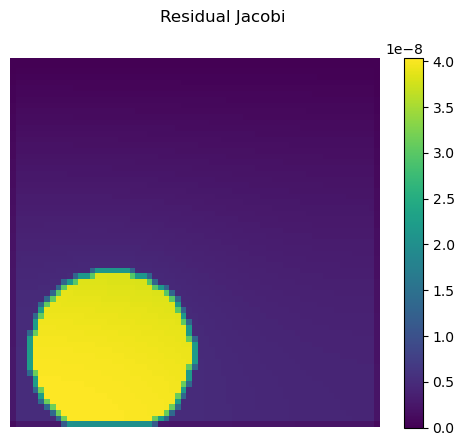

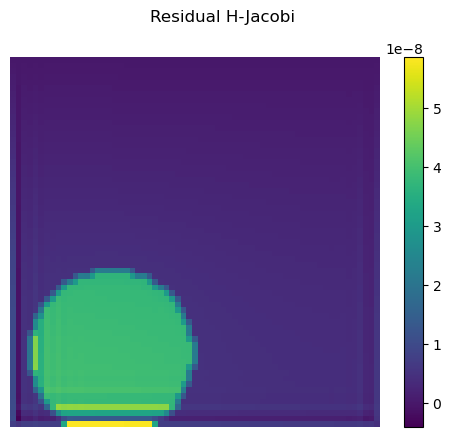

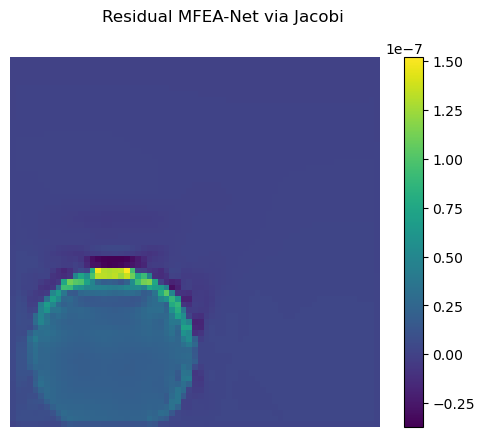

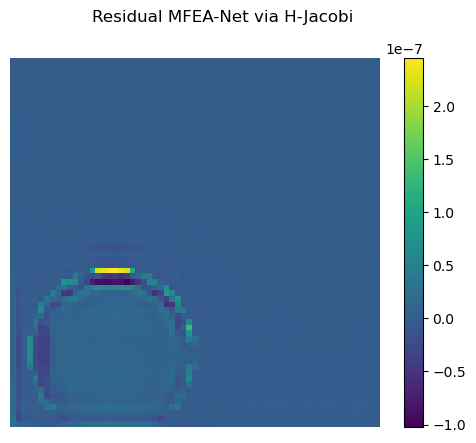

In [16]:
plot.plot_thermalfield((residual_jac).reshape(n+1,n+1), 'Residual Jacobi')
plot.plot_thermalfield((residual_H).reshape(n+1,n+1), 'Residual H-Jacobi')
plot.plot_thermalfield((residual_mgjac).reshape(n+1,n+1), 'Residual MFEA-Net via Jacobi')
plot.plot_thermalfield((residual_mgpsi).reshape(n+1,n+1), 'Residual MFEA-Net via H-Jacobi')

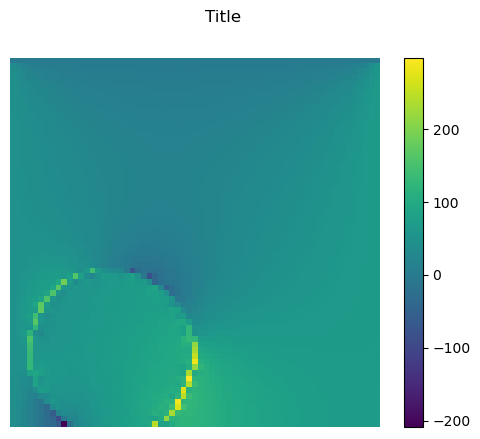

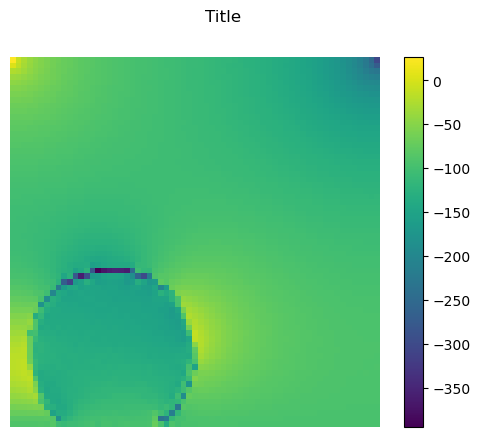

In [17]:
from feanet.post_processing import ThermalPostProcessing
tPost = ThermalPostProcessing(hsize, m_test.float(), emsk_test.float(), nmsk_test.float())
flux1 = tPost.ComputeFlux(u_mg_psi.float())
plot.plot_thermalfield(flux1[:,0])
plot.plot_thermalfield(flux1[:,1])